In [1]:
import scipy
import pickle, random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from time import sleep
from skimage.util import img_as_float
from sklearn.model_selection import train_test_split
import chardet
import sys
import os
sys.path.append("C:/Users/kadio/anaconda3/Lib/site-packages/python_fx-0.1.0b2.post1.dist-info")
#import fx

%load_ext autoreload
%autoreload 2
%matplotlib inline

import skimage
from skimage.color import rgb2hsv
from skimage.io import imread
from skimage.io import imsave
import image_analysis as IA


In [3]:
os.mkdir ("C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_31_frames")


FileExistsError: [WinError 183] Halen varolan bir dosya oluşturulamaz: 'C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_6_frames'

In [ ]:

os.mkdir ("C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_31_frames")
os.mkdir ("C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_32_frames")
os.mkdir ("C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_33_frames")


In [4]:
IA.__file__

'C:\\Users\\kadio\\Downloads\\Gözde-Fintan 04012022\\image_analysis.py'

In [4]:
IA.dump_frames("C:/Users/kadio/Downloads/Gözde-Fintan 04012022/videos/video/My Movie 5.mov", "C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_5_frames/") # Frames requires trailing slash


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207

C:\Users\kadio\Downloads\Gözde-Fintan 04012022\image_analysis.py:93: UserWarning: C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_5_frames/frame0206.jpg is a low contrast image
  imsave(folder+f"frame{count:04}.jpg" , image)     # save frame as JPEG file



208
209


C:\Users\kadio\Downloads\Gözde-Fintan 04012022\image_analysis.py:93: UserWarning: C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_5_frames/frame0209.jpg is a low contrast image
  imsave(folder+f"frame{count:04}.jpg" , image)     # save frame as JPEG file


210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
279
280
281
282
283
284
285
286
287
288
289
290
291
292
293
294
295
296
297
298
299
300
301
302
303
304
305
306
307
308
309
310
311
312
313
314
315
316
317
318
319
320
321
322
323
324
325
326
327
328
329
330
331
332
333
334
335
336
337
338
339
340
341
342
343
344
345
346
347
348
349
350
351
352
353
354
355
356
357
358
359
360
361
362
363
364
365
366
367
368
369
370
371
372
373
374
375
376
377
378
379
380
381
382
383
384
385
386
387
388
389
390
391
392
393
394
395
396
397
398
399
400
401
402
403
404
405
406
407
408
409
410
411
412
413
414
415
416
417
418
419
420
421
422
423
424
425
426
427
428
429
430
431
432
433
434
435
436
437
438
439
440
441
442
443
444
445
446
447
448
449
450
451
452
453
454
455
456
457
458
459


In [5]:
IA.dump_frames("C:/Users/kadio/Downloads/Gözde-Fintan 04012022/videos/video/My Movie 6.mov", "C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_6_frames/") 


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [6]:
IA.dump_frames("C:/Users/kadio/Downloads/Gözde-Fintan 04012022/videos/video/My Movie 7.mov", "C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_7_frames/") 


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [2]:
IA.dump_frames("C:/Users/kadio/Downloads/Gözde-Fintan 04012022/videos/video/My Movie 31.mov", "C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_31_frames/") 


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179


KeyboardInterrupt: 

In [ ]:
IA.dump_frames("C:/Users/kadio/Downloads/Gözde-Fintan 04012022/videos/video/My Movie 32.mov", "C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_32_frames/") 


In [ ]:
IA.dump_frames("C:/Users/kadio/Downloads/Gözde-Fintan 04012022/videos/video/My Movie 33.mov", "C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_33_frames/") 


trial 1: frame 0 at 0 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_31_frames/frame0000.jpg
patch value:
[[[0.64705882 0.58431373 0.59607843]
  [0.64705882 0.58431373 0.59607843]
  [0.64705882 0.58431373 0.59607843]
  ...
  [0.7254902  0.67843137 0.67843137]
  [0.72941176 0.68235294 0.68235294]
  [0.72941176 0.68235294 0.68235294]]

 [[0.64705882 0.58431373 0.59607843]
  [0.64705882 0.58431373 0.59607843]
  [0.65098039 0.58823529 0.6       ]
  ...
  [0.72941176 0.68235294 0.68235294]
  [0.73333333 0.68627451 0.68627451]
  [0.73333333 0.68627451 0.68627451]]

 [[0.64705882 0.58431373 0.59607843]
  [0.65098039 0.58823529 0.6       ]
  [0.65098039 0.58823529 0.6       ]
  ...
  [0.7372549  0.69019608 0.69019608]
  [0.7372549  0.69019608 0.69019608]
  [0.74117647 0.69411765 0.69411765]]

 ...

 [[0.28627451 0.25098039 0.23137255]
  [0.28627451 0.25098039 0.23137255]
  [0.28627451 0.25098039 0.23137255]
  ...
  [0.35294118 0.30588235 0.25882353]
  [0.35294118 0.30588235 0.

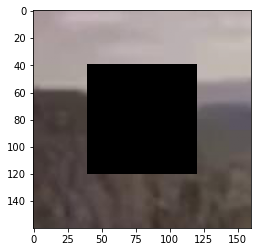

Patch HSV 0.19 0.1 0.37
Square HSV 0.36 1.0 0.66
HSV distance = 0.9627969782905837


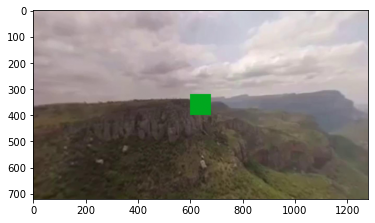

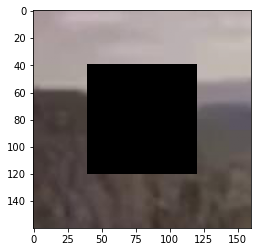

In [75]:
hsv_distances1, dbg1, dffs1, dbpatch1 = IA.run_analysis("C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_31_frames/", 0, 5) # Trailing slash required

In [78]:
dbpatch1 = np.nan_to_num(dbpatch1,0)
dbpatch2 = np.nan_to_num(dbpatch2,0)

In [79]:
np.sum(dbpatch1 - dbpatch2)

0.0

In [25]:
np.sum(dbg2 - dbg1)

0.0

In [36]:
print(dffs1)
print(dffs2)

[-0.16553662184543327, -0.900016138377569, -0.2928026960784314]
[-0.1566788808323644, -0.900016138377569, -0.2928026960784314]


In [77]:
print(hsv_distances1) 
print(hsv_distances2)

[0.9627969782905837]
[0.9608146758573516]


In [3]:
di

[0.9584111158319398,
 0.6754682536904975,
 1.0864066991965997,
 0.8262380431376799]

trial 1: frame 0 at 0 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_31_frames/frame0000.jpg
patch value:
[[[0.64705882 0.58431373 0.59607843]
  [0.64705882 0.58431373 0.59607843]
  [0.64705882 0.58431373 0.59607843]
  ...
  [0.7254902  0.67843137 0.67843137]
  [0.72941176 0.68235294 0.68235294]
  [0.72941176 0.68235294 0.68235294]]

 [[0.64705882 0.58431373 0.59607843]
  [0.64705882 0.58431373 0.59607843]
  [0.65098039 0.58823529 0.6       ]
  ...
  [0.72941176 0.68235294 0.68235294]
  [0.73333333 0.68627451 0.68627451]
  [0.73333333 0.68627451 0.68627451]]

 [[0.64705882 0.58431373 0.59607843]
  [0.65098039 0.58823529 0.6       ]
  [0.65098039 0.58823529 0.6       ]
  ...
  [0.7372549  0.69019608 0.69019608]
  [0.7372549  0.69019608 0.69019608]
  [0.74117647 0.69411765 0.69411765]]

 ...

 [[0.28627451 0.25098039 0.23137255]
  [0.28627451 0.25098039 0.23137255]
  [0.28627451 0.25098039 0.23137255]
  ...
  [0.35294118 0.30588235 0.25882353]
  [0.35294118 0.30588235 0.

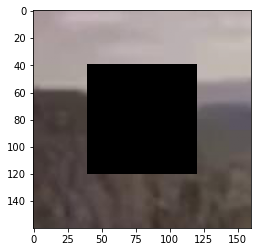

Patch HSV 0.2 0.1 0.37
Square HSV 0.36 1.0 0.66
HSV distance = 0.9608146758573516


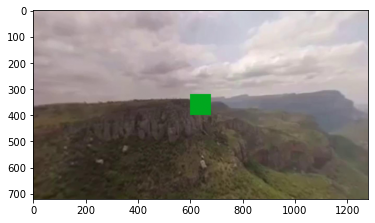

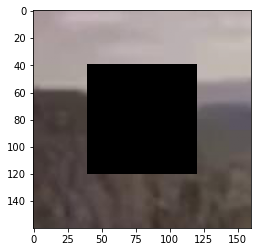

In [76]:
hsv_distances2,dbg2, dffs2, dbpatch2 = IA.run_analysis("C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_31_frames/", 0, 5) 

In [6]:
hsv_distances

[0.9627969782905837, 0.6748593496164119, 1.086605395359908, 0.8262380431376799]

trial 1: frame 0 at 0 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_6_frames/frame0000.jpg
Patch HSV 0.1 0.26 0.47
Square HSV 0.03 0.87 1.0
HSV distance = 0.8089443712517347
trial 2: frame 150 at 5 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_6_frames/frame0150.jpg
Patch HSV 0.09 0.27 0.47
Square HSV 0.03 0.87 1.0
HSV distance = 0.8083756475573893
trial 3: frame 300 at 10 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_6_frames/frame0300.jpg
Patch HSV 0.08 0.27 0.47
Square HSV 0.03 0.87 1.0
HSV distance = 0.8074744462809803
trial 4: frame 450 at 15 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_6_frames/frame0450.jpg
Patch HSV 0.09 0.27 0.47
Square HSV 0.03 0.87 1.0
HSV distance = 0.808050334202439
trial 5: frame 600 at 20 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_6_frames/frame0600.jpg
Patch HSV 0.13 0.27 0.47
Square HSV 0.03 0.87 1.0
HSV distance = 0.8103961736219332
trial 6: frame 750 at 25 s

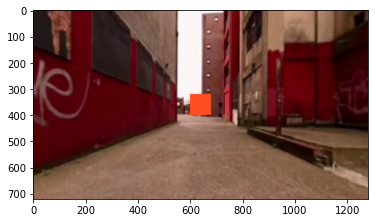

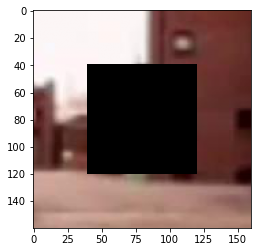

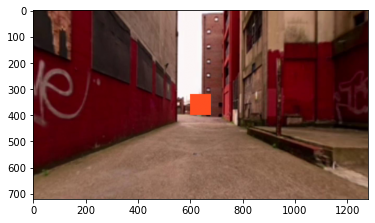

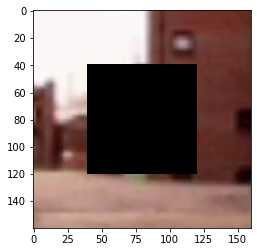

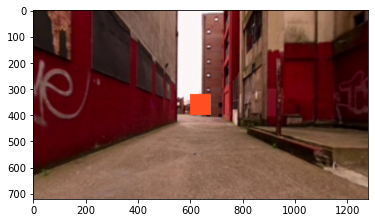

...

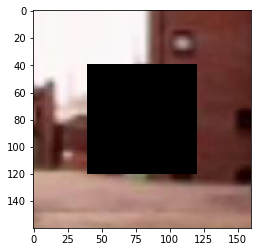

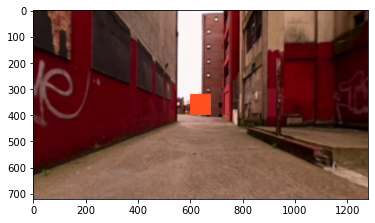

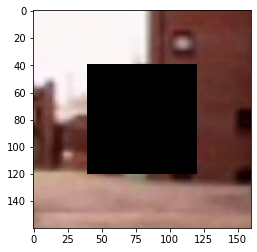

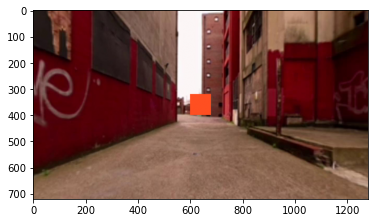

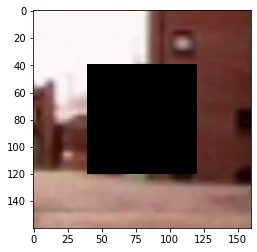

In [206]:
hsv_distances = IA.run_analysis("C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_6_frames/", 0, 5) # Trailing slash required

In [207]:
hsv_distances

[0.8089443712517347,
 0.8083756475573893,
 0.8074744462809803,
 0.808050334202439,
 0.8103961736219332,
 0.8082358607274134,
 0.8066744310969866,
 0.8074395705999472,
 0.806222176744052,
 0.8083374393047008,
 0.807772412607416,
 0.8078525131331296,
 0.8061996348394096]

trial 1: frame 0 at 0 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_7_frames/frame0000.jpg
Patch HSV 0.52 0.12 0.41
Square HSV 0.03 0.87 1.0
HSV distance = 1.074466004268466
trial 2: frame 150 at 5 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_7_frames/frame0150.jpg
Patch HSV 0.57 0.11 0.5
Square HSV 0.03 0.87 1.0
HSV distance = 1.0570014941419423
trial 3: frame 300 at 10 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_7_frames/frame0300.jpg
Patch HSV 0.57 0.14 0.44
Square HSV 0.03 0.87 1.0
HSV distance = 1.0673247928479326
trial 4: frame 450 at 15 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_7_frames/frame0450.jpg
Patch HSV 0.57 0.13 0.42
Square HSV 0.03 0.87 1.0
HSV distance = 1.0796597370666627
trial 5: frame 600 at 20 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_7_frames/frame0600.jpg
Patch HSV 0.59 0.12 0.35
Square HSV 0.03 0.87 1.0
HSV distance = 1.1360936097789718
trial 6: frame 750 at 25 s

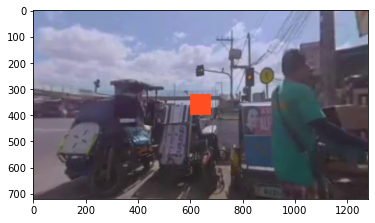

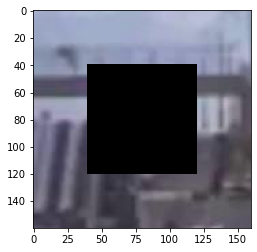

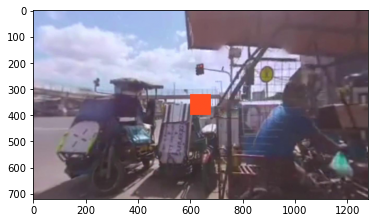

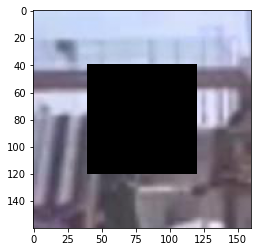

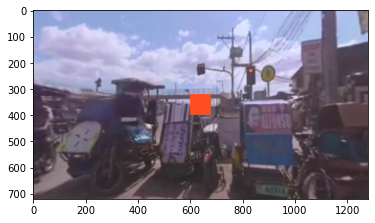

...

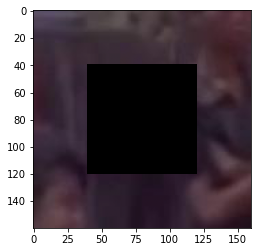

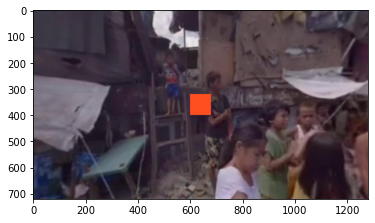

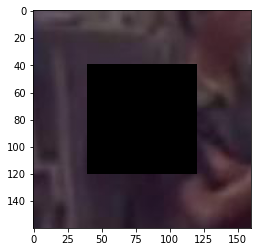

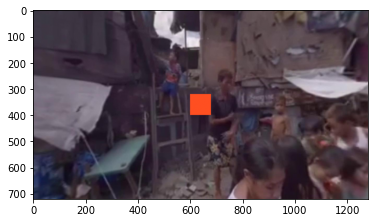

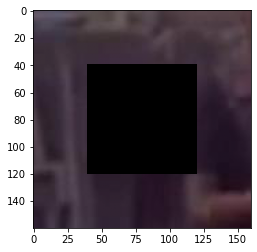

In [208]:
hsv_distances = IA.run_analysis("C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_7_frames/", 0, 5) # Trailing slash required

In [209]:
hsv_distances

[1.074466004268466,
 1.0570014941419423,
 1.0673247928479326,
 1.0796597370666627,
 1.1360936097789718,
 1.1665280255711135,
 1.153232814772971,
 1.11930119252573,
 1.1179726098628684,
 1.128022639698354,
 1.2061739797637197,
 1.2033605549921713,
 1.2086153705544356]

trial 1: frame 0 at 0 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_31_frames/frame0000.jpg
Patch HSV 0.2 0.1 0.37
Square HSV 0.03 0.87 1.0
HSV distance = 1.0109952974217558
trial 2: frame 150 at 5 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_31_frames/frame0150.jpg
Patch HSV 0.13 0.31 0.29
Square HSV 0.03 0.87 1.0
HSV distance = 0.9103935697799
trial 3: frame 300 at 10 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_31_frames/frame0300.jpg
Patch HSV 0.15 0.29 0.24
Square HSV 0.03 0.87 1.0
HSV distance = 0.9622534087358465
trial 4: frame 450 at 15 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_31_frames/frame0450.jpg
Patch HSV 0.12 0.24 0.37
Square HSV 0.03 0.87 1.0
HSV distance = 0.8942905601019042
trial 5: frame 600 at 20 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_31_frames/frame0600.jpg
Patch HSV 0.12 0.24 0.37
Square HSV 0.03 0.87 1.0
HSV distance = 0.8952631875089669
trial 6: frame 750 at 25

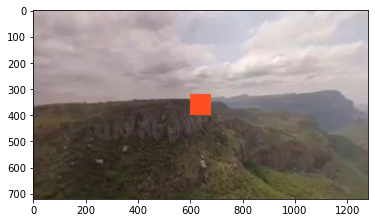

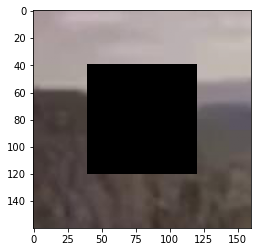

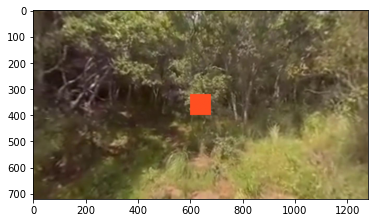

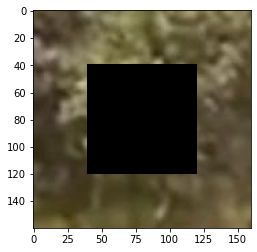

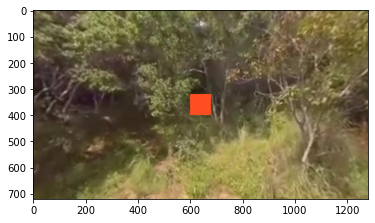

...

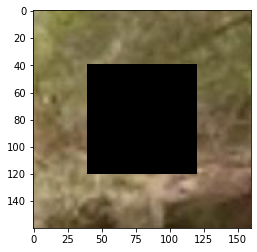

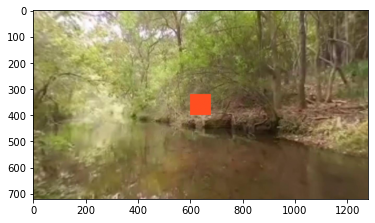

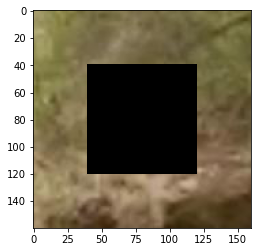

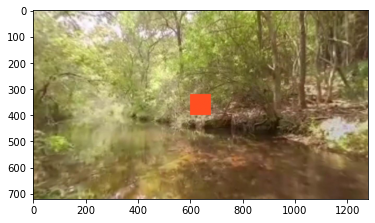

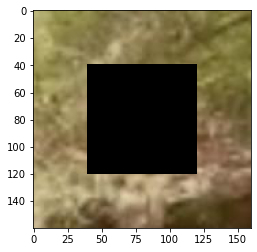

In [210]:
hsv_distances = IA.run_analysis("C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_31_frames/", 0, 5) # Trailing slash required

In [211]:
hsv_distances

[1.0109952974217558,
 0.9103935697799,
 0.9622534087358465,
 0.8942905601019042,
 0.8952631875089669,
 0.9603869806530885,
 0.9975357420546093,
 1.0114393981858627,
 0.8048750580198499,
 0.808366894962931,
 0.8471541070252078,
 0.8374448998842824,
 0.7972421796395063]

trial 1: frame 0 at 0 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_32_frames/frame0000.jpg
Patch HSV 0.09 0.3 0.51
Square HSV 0.03 0.87 1.0
HSV distance = 0.7533276937408866
trial 2: frame 150 at 5 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_32_frames/frame0150.jpg
Patch HSV 0.09 0.12 0.29
Square HSV 0.03 0.87 1.0
HSV distance = 1.0376881835316645
trial 3: frame 300 at 10 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_32_frames/frame0300.jpg
Patch HSV 0.14 0.03 0.64
Square HSV 0.03 0.87 1.0
HSV distance = 0.9217678197266883
trial 4: frame 450 at 15 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_32_frames/frame0450.jpg
Patch HSV 0.34 0.01 0.66
Square HSV 0.03 0.87 1.0
HSV distance = 0.9730204152409739
trial 5: frame 600 at 20 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_32_frames/frame0600.jpg
Patch HSV 0.37 0.02 0.63
Square HSV 0.03 0.87 1.0
HSV distance = 0.9890771942463205
trial 6: frame 750 a

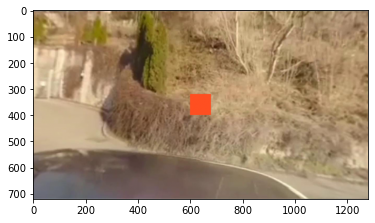

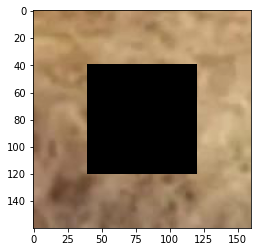

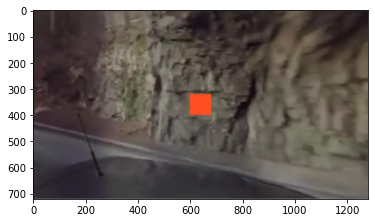

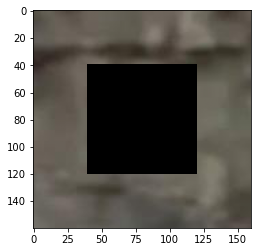

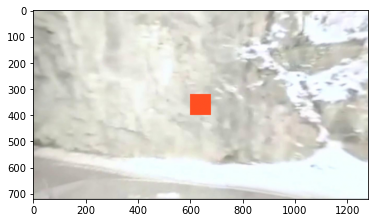

...

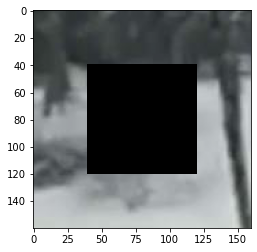

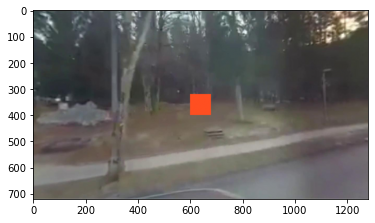

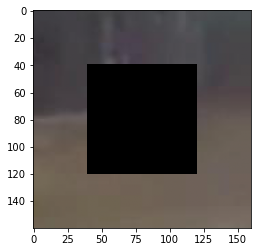

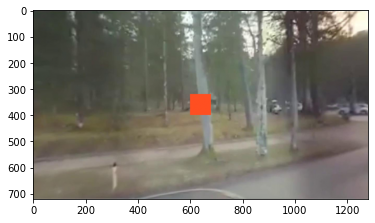

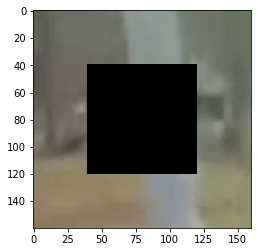

In [212]:
hsv_distances = IA.run_analysis("C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_32_frames/", 0, 5) # Trailing slash required

In [213]:
hsv_distances

[0.7533276937408866,
 1.0376881835316645,
 0.9217678197266883,
 0.9730204152409739,
 0.9890771942463205,
 1.1041704117559354,
 0.9838523957796206,
 1.165932404254998,
 0.9829932724317832,
 1.133443495007194,
 1.0920293080703556,
 1.0830767577854168,
 0.9868669184724103]

trial 1: frame 0 at 0 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_33_frames/frame0000.jpg
Patch HSV 0.58 0.22 0.37
Square HSV 0.03 0.87 1.0
HSV distance = 1.0619790498463928
trial 2: frame 150 at 5 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_33_frames/frame0150.jpg
Patch HSV 0.49 0.24 0.58
Square HSV 0.03 0.87 1.0
HSV distance = 0.884414617590502
trial 3: frame 300 at 10 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_33_frames/frame0300.jpg
Patch HSV 0.52 0.12 0.42
Square HSV 0.03 0.87 1.0
HSV distance = 1.0666992699613302
trial 4: frame 450 at 15 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_33_frames/frame0450.jpg
Patch HSV 0.51 0.3 0.48
Square HSV 0.03 0.87 1.0
HSV distance = 0.9069871586198703
trial 5: frame 600 at 20 seconds
C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_33_frames/frame0600.jpg
Patch HSV 0.57 0.12 0.59
Square HSV 0.03 0.87 1.0
HSV distance = 1.0095760127430404
trial 6: frame 750 at

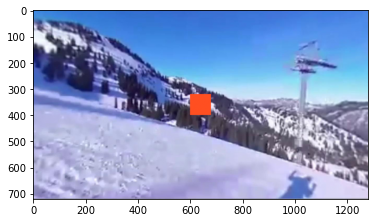

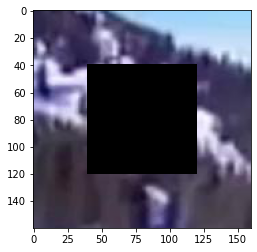

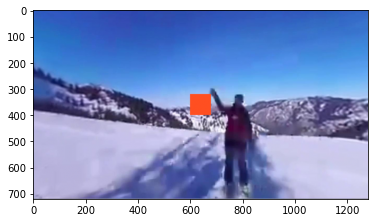

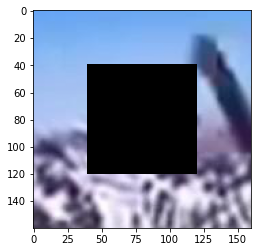

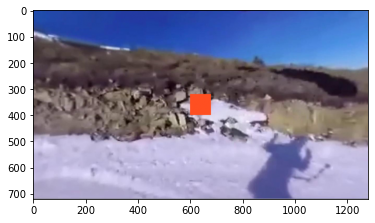

...

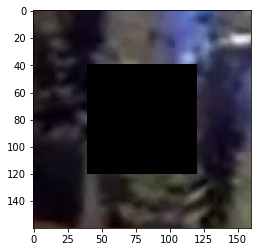

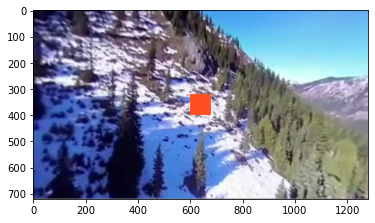

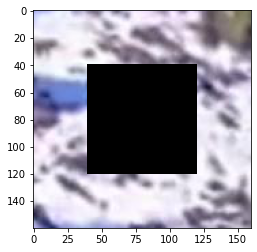

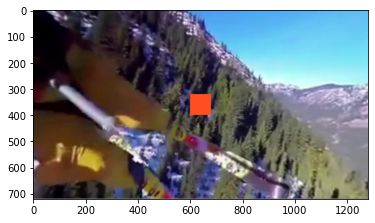

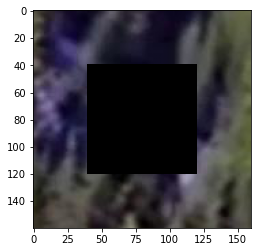

In [214]:
hsv_distances = IA.run_analysis("C:/Users/kadio/Downloads/Gözde-Fintan 04012022/My_Movie_33_frames/", 0, 5) # Trailing slash required

In [215]:
hsv_distances

[1.0619790498463928,
 0.884414617590502,
 1.0666992699613302,
 0.9069871586198703,
 1.0095760127430404,
 0.9723550323752896,
 1.0107510624489064,
 0.9957329545303618,
 0.9472556955507835,
 1.0070724351007674,
 1.095507181861668,
 1.0171403315881553,
 1.0851430483078102]

A subdirectory or file 'frames_HAHV1' already exists.


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

trial 3: frame 450 at 15 seconds
frames_HAHV1/frame0450.jpg
Patch HSV 0.5 0.38 0.49
Square HSV 0.75 1.0 0.42
HSV distance = 0.6725507892934809
trial 4: frame 600 at 20 seconds
frames_HAHV1/frame0600.jpg
Patch HSV 0.48 0.34 0.51
Square HSV 0.75 1.0 0.42
HSV distance = 0.7164184515219064
trial 5: frame 750 at 25 seconds
frames_HAHV1/frame0750.jpg
Patch HSV 0.48 0.4 0.48
Square HSV 0.75 1.0 0.42
HSV distance = 0.663702414592193
trial 6: frame 900 at 30 seconds
frames_HAHV1/frame0900.jpg
Patch HSV 0.58 0.34 0.46
Square HSV 0.75 1.0 0.42
HSV distance = 0.6844121828815503
trial 7: frame 1050 at 35 seconds
frames_HAHV1/frame1050.jpg
Patch HSV 0.46 0.37 0.47
Square HSV 0.75 1.0 0.42
HSV distance = 0.6978472193546837
trial 8: frame 1200 at 40 seconds
frames_HAHV1/frame1200.jpg
Patch HSV 0.42 0.3 0.53
Square HSV 0.75 1.0 0.42
HSV distance = 0.7797295524137443
trial 9: frame 1350 at 45 seconds
frames_HAHV1/frame1350.jpg
Patch HSV 0.45 0.33 0.47
Square HSV 0.75 1.0 0.42
HSV distance = 0.7342118681

FileNotFoundError: No such file: 'C:\Users\kadio\Downloads\Gözde-Fintan 04012022\frames_HAHV1\frame1950.jpg'

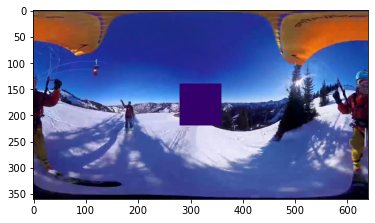

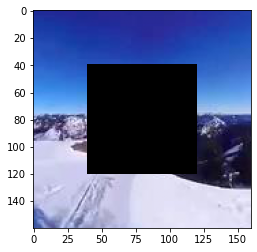

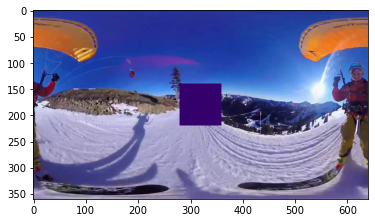

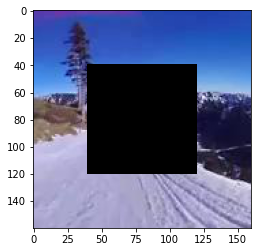

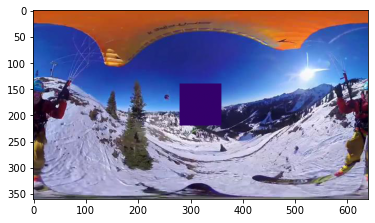

...

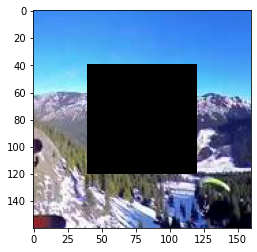

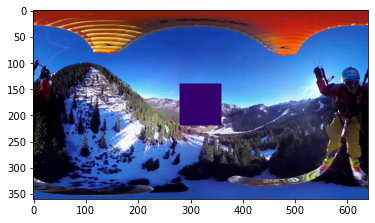

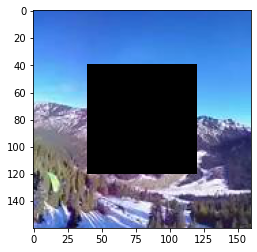

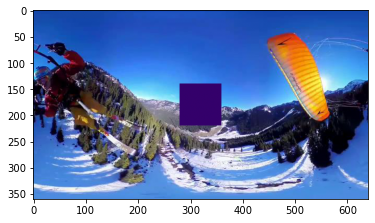

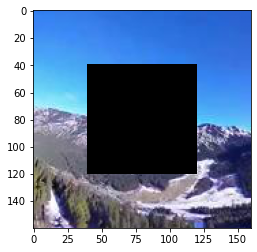

In [138]:
!mkdir 'frames_HAHV1'
IA.dump_frames("videos/HAHV1.mp4", 'frames_HAHV1/')
hsv_distances = IA.run_analysis('frames_HAHV1/', 5, 5)

In [ ]:
hsv_distances

In [7]:
%pdb

Automatic pdb calling has been turned ON


0
Patch HSV 0.57 0.35 0.61
Square HSV 0.33 1.0 0.69
HSV distance = 0.6950434524098478
150
Patch HSV 0.54 0.36 0.56
Square HSV 0.27 0.88 0.75
HSV distance = 0.6203477454261138
300
Patch HSV 0.55 0.34 0.52
Square HSV 0.52 1.0 0.96
HSV distance = 0.7959020895147181
450
Patch HSV 0.56 0.38 0.49
Square HSV 0.39 0.93 0.56
HSV distance = 0.5813345489155862
600
Patch HSV 0.55 0.34 0.51
Square HSV 0.62 1.0 1.0
HSV distance = 0.8221178286710656
750
Patch HSV 0.54 0.4 0.48
Square HSV 0.74 0.93 0.48
HSV distance = 0.5745658357396946
900
Patch HSV 0.56 0.34 0.46
Square HSV 0.16 0.88 0.88
HSV distance = 0.7944685237313903
1050
Patch HSV 0.45 0.37 0.47
Square HSV 1.0 1.0 0.96
HSV distance = 0.9699476699562963
1200
Patch HSV 0.46 0.3 0.53
Square HSV 0.91 1.0 1.0
HSV distance = 0.9586559990586025
1350
Patch HSV 0.49 0.33 0.47
Square HSV 0.04 1.0 0.44
HSV distance = 0.8036108895952075
1500
Patch HSV 0.51 0.34 0.55
Square HSV 0.03 0.98 0.75
HSV distance = 0.830838597857022
1650
Patch HSV 0.53 0.35 0.55
S

IndexError: list index out of range

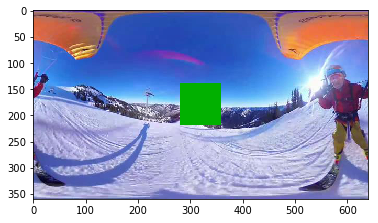

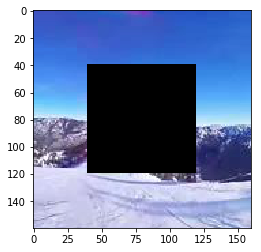

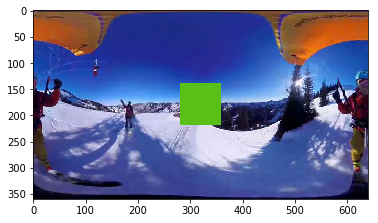

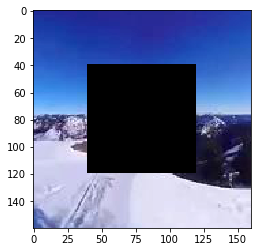

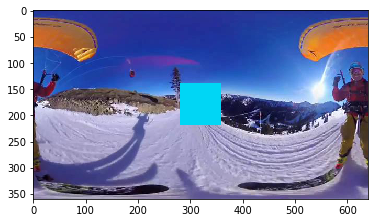

...

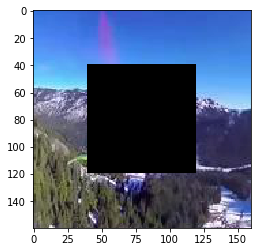

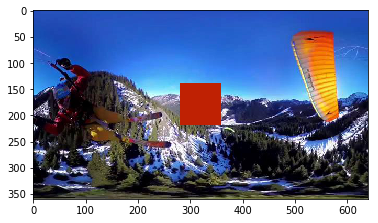

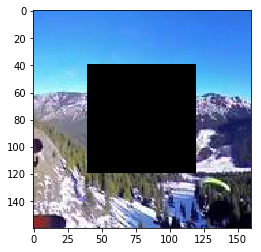

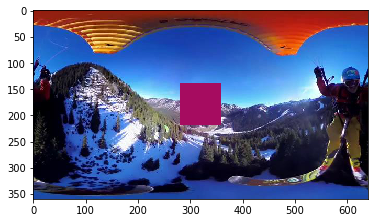

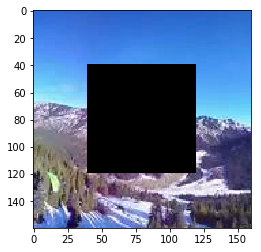

In [12]:
hsv_distances = IA.run_analysis('frames_HAHV1/', 0, 5)

trial 1: frame 150 at 5 seconds
Patch HSV 0.54 0.36 0.56
Square HSV 0.36 1.0 0.66
HSV distance = 0.6733545694046251
trial 2: frame 300 at 10 seconds
Patch HSV 0.55 0.34 0.52
Square HSV 0.31 0.77 0.73
HSV distance = 0.5421251044987752
trial 3: frame 450 at 15 seconds
Patch HSV 0.56 0.38 0.49
Square HSV 0.52 1.0 0.95
HSV distance = 0.7709412695425741
trial 4: frame 600 at 20 seconds
Patch HSV 0.55 0.34 0.51
Square HSV 0.4 1.0 0.53
HSV distance = 0.6758631543412811
trial 5: frame 750 at 25 seconds
Patch HSV 0.54 0.4 0.48
Square HSV 0.64 0.91 0.98
HSV distance = 0.720693523628979
trial 6: frame 900 at 30 seconds
Patch HSV 0.56 0.34 0.46
Square HSV 0.75 1.0 0.42
HSV distance = 0.6900932500637834
trial 7: frame 1050 at 35 seconds
Patch HSV 0.45 0.37 0.47
Square HSV 0.16 0.76 0.86
HSV distance = 0.6306746580713904
trial 8: frame 1200 at 40 seconds
Patch HSV 0.46 0.3 0.53
Square HSV 0.98 1.0 0.98
HSV distance = 0.9869521065041152
trial 9: frame 1350 at 45 seconds
Patch HSV 0.49 0.33 0.47
Squar

FileNotFoundError: No such file: '/Users/fintan/Dropbox/City/Gozde/frames/frame1950.jpg'

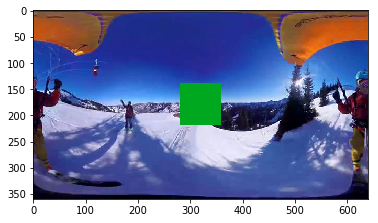

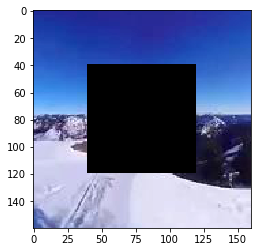

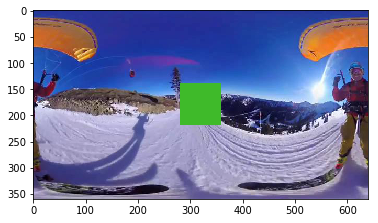

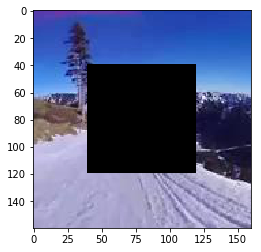

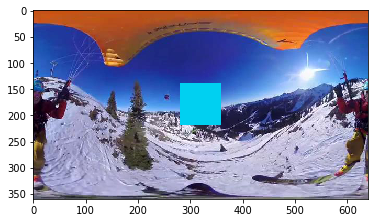

...

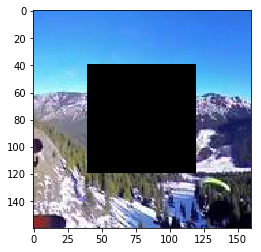

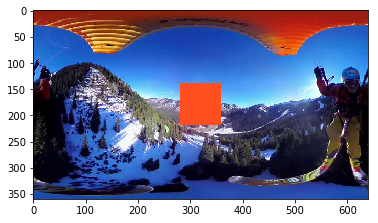

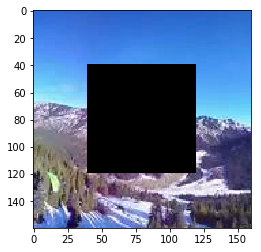

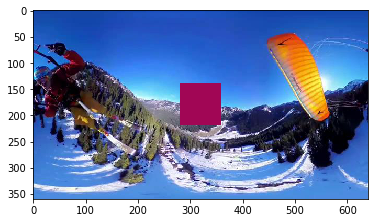

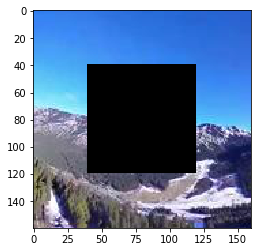

In [11]:
#!mkdir 'My_Movie_4_frames/' # Requires trailing slash
#IA.dump_frames("videos/video/My Movie 4.mov", 'My_Movie_4_frames/')
hsv_distances = IA.run_analysis('My_Movie_4_frames/', 5, 5)